# Enade 2018

A prova do Enade afere o desempenho dos estudantes em relação aos conteúdos programáticos previstos nas Diretrizes Curriculares Nacionais ou no Catálogo Nacional de Cursos Superiores de Tecnologia do respectivo curso de graduação, suas habilidades para  ajustamento às exigências decorrentes da evolução do conhecimento e suas competências  para compreender temas exteriores ao âmbito específico de sua profissão, ligados à realidade  brasileira e mundial e a outras áreas do conhecimento.

As provas são compostas por uma parte de Formação Geral, comum aos cursos de todas as áreas, e uma parte de Componente Específico, própria de cada área de avaliação. A parte de Formação Geral tem 10 questões, sendo duas discursivas e oito de de múltipla escolha, envolvendo situações-problema e estudos de casos. A concepção dos itens é balizada pelos princípios dos Direitos Humanos. As questões discursivas avaliam aspectos como clareza, coerência, coesão, estratégias argumentativas, utilização de vocabulário adequado e correção gramatical do texto. Já a parte de Componente Específico de cada área de avaliação tem 30 questões, sendo três discursivas e 27 de múltipla escolha, envolvendo situações-problema e estudos de casos.

Fonte: INEP

Portanto, o presente trabalho tem como objetivo compreender através da aplicação de técnicas de mineração de dados no dataset do ENADE de 2018 possíveis correlações entre fatores socioeconômicos, educacionais e o desempenho dos alunos

Os dados foram obtidos a partir do site do Governo Federal (2020) que contém dados do exame realizado no ano de 2018, possibilitando assim uma grande gama de informações que possibilitou uma análise exploratória dos dados direcionando-se nas características que impactam diretamente na nota no aluno, como fatores socioeconômico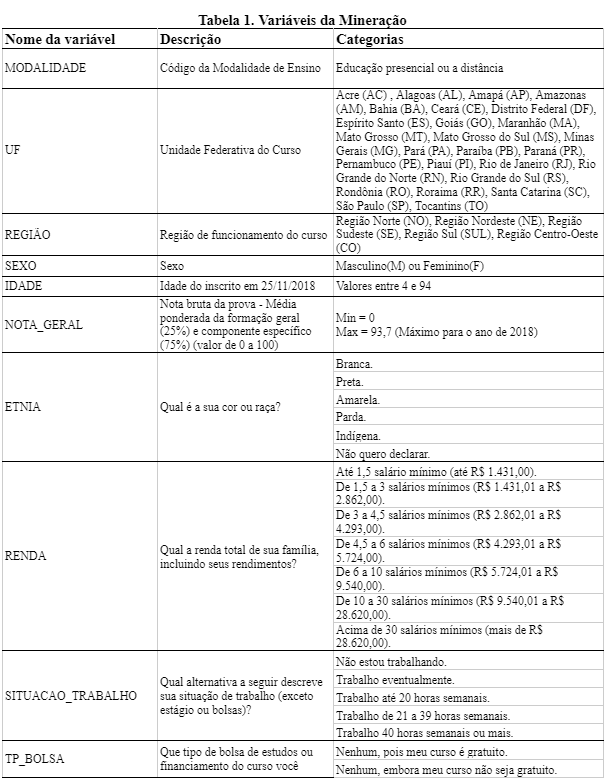
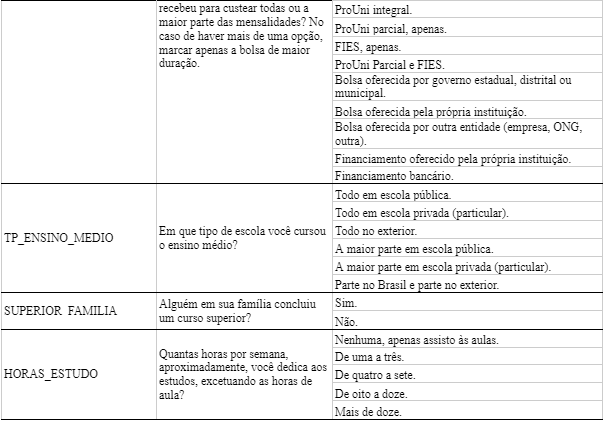

### Impotando bilbiotecas

In [35]:
!pip install apyori

In [36]:
import numpy as np
from IPython.display import clear_output
import pandas as pd
from sklearn import metrics
import seaborn as sns
import matplotlib.pyplot as plt
import sys
import os
#sys.path.append('../utils/')
from sklearn.inspection import plot_partial_dependence
from apyori import apriori

### Lendo Dataset

In [37]:
# dataset = pd.read_csv('microdados_enade_2018/2018/3.DADOS/microdados_enade_2018.txt', sep=';',nrows=5000,header=0, index_col=False, encoding="ISO-8859-1")
#dataset/2004/2.DADOS/microdados_enade_2004.csv
dataset = pd.read_csv('/content/microdados_enade_2018.txt', sep=';',header=0, index_col=False, encoding="ISO-8859-1")

In [38]:
dataset

,NU_ANO,CO_IES,CO_CATEGAD,CO_ORGACAD,CO_GRUPO,CO_CURSO,CO_MODALIDADE,CO_MUNIC_CURSO,CO_UF_CURSO,CO_REGIAO_CURSO,NU_IDADE,TP_SEXO,ANO_FIM_EM,ANO_IN_GRAD,CO_TURNO_GRADUACAO,TP_INSCRICAO_ADM,TP_INSCRICAO,NU_ITEM_OFG,NU_ITEM_OFG_Z,NU_ITEM_OFG_X,NU_ITEM_OFG_N,NU_ITEM_OCE,NU_ITEM_OCE_Z,NU_ITEM_OCE_X,NU_ITEM_OCE_N,DS_VT_GAB_OFG_ORIG,DS_VT_GAB_OFG_FIN,DS_VT_GAB_OCE_ORIG,DS_VT_GAB_OCE_FIN,DS_VT_ESC_OFG,DS_VT_ACE_OFG,DS_VT_ESC_OCE,DS_VT_ACE_OCE,TP_PRES,TP_PR_GER,TP_PR_OB_FG,TP_PR_DI_FG,TP_PR_OB_CE,TP_PR_DI_CE,TP_SFG_D1,...,QE_I29,QE_I30,QE_I31,QE_I32,QE_I33,QE_I34,QE_I35,QE_I36,QE_I37,QE_I38,QE_I39,QE_I40,QE_I41,QE_I42,QE_I43,QE_I44,QE_I45,QE_I46,QE_I47,QE_I48,QE_I49,QE_I50,QE_I51,QE_I52,QE_I53,QE_I54,QE_I55,QE_I56,QE_I57,QE_I58,QE_I59,QE_I60,QE_I61,QE_I62,QE_I63,QE_I64,QE_I65,QE_I66,QE_I67,QE_I68
0,2018,1356,10003,10020,1,47116,1,3546603,35,3,22,M,2013,2015.0,4.0,0,0,8,0,0,0,27,1,8,0,CACBEBDE,CACBEBDE,ADBBDEDCEEDCAEZADBCBDABECBB,XXBXDEDXEEDCAEZADBCBXAXECXX,CACCDDDD,11100010.0,BADBDADAEACAABAADBECBDACCCA,990910191000108111009090199,555,555,555,555,555,555,555,...,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,5.0
1,2018,1356,10003,10020,1,47116,1,3546603,35,3,49,F,1988,2015.0,4.0,0,0,8,0,0,0,27,1,8,0,CACBEBDE,CACBEBDE,ADBBDEDCEEDCAEZADBCBDABECBB,XXBXDEDXEEDCAEZADBCBXAXECXX,CAADEDDE,11001011.0,BBDBEEDAEBCEAEBADBCBBEAECCA,990901191000118111119091199,555,555,555,555,555,555,555,...,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0
2,2018,1356,10003,10020,1,47116,1,3546603,35,3,23,M,2013,2015.0,4.0,0,0,8,0,0,0,27,1,8,0,CACBEBDE,CACBEBDE,ADBBDEDCEEDCAEZADBCBDABECBB,XXBXDEDXEEDCAEZADBCBXAXECXX,CAAACBBE,11000101.0,CDDBDCDAEEDCACDADDCBBDAECCA,990910191111108110119091199,555,555,555,555,555,555,555,...,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,5.0,6.0,6.0,6.0,6.0,5.0,6.0,6.0,6.0,5.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,5.0
3,2018,1356,10003,10020,1,47116,1,3546603,35,3,25,M,2011,2015.0,4.0,0,0,8,0,0,0,27,1,8,0,CACBEBDE,CACBEBDE,ADBBDEDCEEDCAEZADBCBDABECBB,XXBXDEDXEEDCAEZADBCBXAXECXX,BAADDBCC,1000100.0,BACAAADBEBEACDDBCACBAABACBC,990900191000008000119190199,555,555,555,555,555,555,336,...,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,5.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,5.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,5.0,6.0,6.0,6.0,6.0,4.0
4,2018,1356,10003,10020,1,47116,1,3546603,35,3,22,F,2014,2015.0,4.0,0,0,8,0,0,0,27,1,8,0,CACBEBDE,CACBEBDE,ADBBDEDCEEDCAEZADBCBDABECBB,XXBXDEDXEEDCAEZADBCBXAXECXX,CABBDBBE,11010101.0,BEDEDCDBBADADEDACEECAEAECCA,990910190010018100009091199,555,555,555,555,555,555,555,...,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
548122,2018,1723,10008,10022,13,1105114,1,3547809,35,3,23,M,2013,2014.0,4.0,1,1,8,0,0,0,27,0,4,0,CACBEBDE,CACBEBDE,CDDBDADAEDBCCECBCEBACBACEEB,CDDBDADAEDBCXEXBCEBAXBACXEB,NaN,NaN,NaN,NaN,222,222,222,222,222,222,222,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
548123,2018,1201,10005,10022,22,50787,1,3144805,31,3,29,M,0,NaN,NaN,1,1,8,0,0,0,27,2,9,0,CACBEBDE,CACBEBDE,DAEBDCACCEBADDCAZZDCEBEDBAB,XXEXXCACCEBADXCAZZXXEBXDBXB,NaN,NaN,NaN,NaN,222,222,222,222,222,222,222,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

## Pre-processing

Nessa etapa, retiramos tuplas com NaN e colunas desnecessarias para a análise

#### Será realizado um drop filtrado pela colunaTP_PRES (Presença do Aluno), pois onde contém 222,334, 444 ou 556, são pessoas/candidatos que ausentaram-se na prova ou foram eliminados, assim como as colunas de presença : TP_PR_GER,  TP_PR_OB_FG, TP_PR_DI_FG, TP_PR_OB_CE e TP_PR_DI_CE

In [39]:
# 222,334,444,556 -> pessoas ausentes ou eliminadas
auxList = []
for i in range(len(dataset.index)):
    if(dataset['TP_PRES'][i] != 555 or dataset['TP_PR_GER'][i] != 555 or dataset['TP_PR_OB_FG'][i] != 555 or dataset['TP_PR_DI_FG'][i] != 555 or dataset['TP_PR_OB_CE'][i] != 555 or dataset['TP_PR_DI_CE'][i] != 555):
        auxList.append(i)
        
dataset = dataset.drop(auxList, axis=0)
dataset = dataset.reset_index()

#### Eliminando tuplas na qual não possue nota bruta (NT_GER), pois é a variável mais importante pois armazena o desempenho do aluno

In [40]:
auxList =  dataset[dataset['NT_GER'].isnull()].index
dataset = dataset.drop(auxList, axis=0)
dataset = dataset.reset_index()

#### Informações sobre o dataset até o momento

In [41]:
dataset.describe()

,level_0,index,NU_ANO,CO_IES,CO_CATEGAD,CO_ORGACAD,CO_GRUPO,CO_CURSO,CO_MODALIDADE,CO_MUNIC_CURSO,CO_UF_CURSO,CO_REGIAO_CURSO,NU_IDADE,ANO_FIM_EM,ANO_IN_GRAD,CO_TURNO_GRADUACAO,TP_INSCRICAO_ADM,TP_INSCRICAO,NU_ITEM_OFG,NU_ITEM_OFG_Z,NU_ITEM_OFG_X,NU_ITEM_OFG_N,NU_ITEM_OCE,NU_ITEM_OCE_Z,NU_ITEM_OCE_X,NU_ITEM_OCE_N,DS_VT_ACE_OFG,TP_PRES,TP_PR_GER,TP_PR_OB_FG,TP_PR_DI_FG,TP_PR_OB_CE,TP_PR_DI_CE,TP_SFG_D1,TP_SFG_D2,TP_SCE_D1,TP_SCE_D2,TP_SCE_D3,NT_FG_D1,NT_FG_D1_PT,...,QE_I29,QE_I30,QE_I31,QE_I32,QE_I33,QE_I34,QE_I35,QE_I36,QE_I37,QE_I38,QE_I39,QE_I40,QE_I41,QE_I42,QE_I43,QE_I44,QE_I45,QE_I46,QE_I47,QE_I48,QE_I49,QE_I50,QE_I51,QE_I52,QE_I53,QE_I54,QE_I55,QE_I56,QE_I57,QE_I58,QE_I59,QE_I60,QE_I61,QE_I62,QE_I63,QE_I64,QE_I65,QE_I66,QE_I67,QE_I68
count,399959.000000,399959.00000,399959.0,399959.000000,399959.000000,399959.000000,399959.000000,3.999590e+05,399959.000000,3.999590e+05,399959.000000,399959.000000,399959.000000,399959.000000,399959.000000,399959.000000,399959.0,399959.0,399959.0,399959.0,399959.0,399959.0,399959.0,399959.000000,399959.000000,399959.0,3.999590e+05,399959.0,399959.0,399959.0,399959.0,399959.0,399959.0,399959.000000,399959.000000,399959.000000,399959.000000,399959.000000,399959.000000,399959.000000,...,394834.000000,393981.000000,394873.000000,390972.000000,395492.000000,394508.000000,394879.000000,395044.000000,392875.000000,394252.000000,391970.000000,379464.000000,392373.000000,395486.000000,375476.000000,368848.000000,383652.000000,329643.000000,385384.000000,384162.000000,393566.000000,333506.000000,360205.000000,307611.000000,292521.000000,381216.000000,392530.000000,384362.000000,394860.000000,386776.000000,388796.000000,372010.000000,390030.000000,365262.000000,359584.000000,384275.000000,365840.000000,383988.000000,368802.000000,384787.000000
mean,200023.781645,267994.14466,2018.0,1487.287269,8025.262594,10024.430229,67.478952,3.269406e+05,1.161584,3.463662e+06,34.450529,3.108189,28.765501,2008.639453,2014.467228,3.326616,0.0,0.0,8.0,0.0,0.0,0.0,27.0,0.453114,6.511880,0.0,5.759030e+06,555.0,555.0,555.0,555.0,555.0,555.0,542.328039,544.218820,529.625472,516.256506,531.445928,42.757725,61.606915,...,5.013254,4.937467,5.318913,5.163628,5.313116,5.283317,5.213030,5.216156,4.900342,4.927752,5.026959,4.642838,4.839688,5.167748,4.746269,4.661853,4.888714,4.404853,4.844511,4.666271,5.084314,5.047232,5.157691,4.048490,3.764294,5.074131,5.112931,4.871494,5.175736,5.088154,4.908716,4.694471,4.890162,4.886898,4.909857,4.935825,4.956134,5.163328,4.718253,4.930515
std,115492.569833,157181.30590,0.0,2527.927166,3979.993418,3.531613,180.445472,7.038336e+05,0.368069,8.608559e+05,8.605689,0.950739,8.067743,7.787121,1.727360,1.155708,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.674336,2.425056,0.0,5.070206e+06,0.0,0.0,0.0,0.0,0.0,0.0,51.299959,47.568825,70.455857,84.147494,68.317063,19.579047,19.280602,...,1.297066,1.362837,1.165171,1.295051,1.148875,1.170972,1.195018,1.167393,1.368064,1.295228,1.273620,1.489338,1.502961,1.236639,1.555612,1.599621,1.453728,1.715003,1.438310,1.507930,1.257832,1.430272,1.286250,1.966822,2.069490,1.397323,1.221226,1.422153,1.180591,1.336295,1.444843,1.601065,1.434885,1.469280,1.451960,1.432337,1.513698,1.274373,1.581931,1.482851
min,0.000000,0.00000,2018.0,1.000000,93.000000,10019.000000,1.000000,1.000000e+00,1.000000,1.100023e+06,11.000000,1.000000,4.000000,1012.000000,1979.000000,1.000000,0.0,0.0,8.0,0.0,0.0,0.0,27.0,0.000000,0.000000,0.0,0.000000e+00,555.0,555.0,555.0,555.0,555.0,555.0,333.000000,333.000000,333.000000,333.000000,333.000000,0.000000,0.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,99998.500000,130559.50000,2018.0,322.000000,10002.000000,10022.000000,2.000000,2.0

#### Filtrando as colunas que serão utilizadas
O foco desse parte é deixar somente dados relacionados com os fatores socioeconômicos, educacionais e o desempenho dos alunos

In [42]:
dataset = dataset[['TP_SEXO','NU_IDADE','CO_UF_CURSO' , 'CO_REGIAO_CURSO','QE_I08','QE_I10'    ,'QE_I02','QE_I11'  ,'QE_I17'      ,'QE_I21'      ,'QE_I23'         ,'NU_ANO'   ,'NT_GER'    ,'NT_FG'       ,'NT_CE'    ,'TP_PRES','CO_ORGACAD','CO_MODALIDADE','CO_RS_I1','CO_RS_I2','CO_RS_I3','CO_RS_I4','CO_RS_I5','CO_RS_I9']]
dataset.columns = ['SEXO'   ,'IDADE'   ,'CO_UF_CURSO' , 'CO_REGIAO_CURSO', 'RENDA','S_TRABALHO','ETNIA' ,'TP_BOLSA','ENSINO_MEDIO','SUP_FAMILIAR','HORAS_DE_ESTUDO','ANO_ENADE','NOTA_GERAL','NOTA_F_GERAL', 'NOTA_ESP','TP_PRES','CO_ORGACAD','CO_MODALIDADE','CO_RS_I1','CO_RS_I2','CO_RS_I3','CO_RS_I4','CO_RS_I5','CO_RS_I9']

#### Conferindo a quantidade de colunas

In [43]:
len(dataset.columns)

24

#### Capturando informações básicas do dataset
Pode-se ver o tipo da coluna, para a plicação do algoritimo de data-mininf é necessario que o dataset esteja no formato de transações( one hot encoder )

In [44]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 399959 entries, 0 to 399958
Data columns (total 24 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   SEXO             399959 non-null  object
 1   IDADE            399959 non-null  int64 
 2   CO_UF_CURSO      399959 non-null  int64 
 3   CO_REGIAO_CURSO  399959 non-null  int64 
 4   RENDA            397928 non-null  object
 5   S_TRABALHO       397928 non-null  object
 6   ETNIA            397928 non-null  object
 7   TP_BOLSA         397928 non-null  object
 8   ENSINO_MEDIO     397928 non-null  object
 9   SUP_FAMILIAR     397928 non-null  object
 10  HORAS_DE_ESTUDO  397928 non-null  object
 11  ANO_ENADE        399959 non-null  int64 
 12  NOTA_GERAL       399959 non-null  object
 13  NOTA_F_GERAL     399959 non-null  object
 14  NOTA_ESP         399959 non-null  object
 15  TP_PRES          399959 non-null  int64 
 16  CO_ORGACAD       399959 non-null  int64 
 17  CO_MODALID

#### Verificando a quantidade total de NaN/Null no dataset

In [45]:
dataset.isnull().sum().sum()

14217

#### Verificando a quantidade de NaN em cada coluna

In [46]:
for i in range(len(dataset.columns)):
    print(f'Coluna: {dataset.columns[i]} qtd: {dataset[dataset.columns[i]].isnull().sum().sum()}')

Coluna: SEXO qtd: 0
Coluna: IDADE qtd: 0
Coluna: CO_UF_CURSO qtd: 0
Coluna: CO_REGIAO_CURSO qtd: 0
Coluna: RENDA qtd: 2031
Coluna: S_TRABALHO qtd: 2031
Coluna: ETNIA qtd: 2031
Coluna: TP_BOLSA qtd: 2031
Coluna: ENSINO_MEDIO qtd: 2031
Coluna: SUP_FAMILIAR qtd: 2031
Coluna: HORAS_DE_ESTUDO qtd: 2031
Coluna: ANO_ENADE qtd: 0
Coluna: NOTA_GERAL qtd: 0
Coluna: NOTA_F_GERAL qtd: 0
Coluna: NOTA_ESP qtd: 0
Coluna: TP_PRES qtd: 0
Coluna: CO_ORGACAD qtd: 0
Coluna: CO_MODALIDADE qtd: 0
Coluna: CO_RS_I1 qtd: 0
Coluna: CO_RS_I2 qtd: 0
Coluna: CO_RS_I3 qtd: 0
Coluna: CO_RS_I4 qtd: 0
Coluna: CO_RS_I5 qtd: 0
Coluna: CO_RS_I9 qtd: 0


### OBS:
### Infelizmente não conseguimos achar o motivo das variáveis S_TRABALHO, RENDA, ETNIA, TP_BOLSA, ENSINO_MEDIO SUP_FAMILIAR e HORAS_DE_ESTUDO conterem as mesmas quantidades de dados NaN, para não perder muito tempo, preferi eliminar as respectivas linhas, não afetando de forma signficativa o dataset pela baixa quantidade de NaN 

In [47]:
dataset = dataset.dropna()
dataset = dataset.reset_index()
len(dataset.dropna())

397928

### Organizando as Variáveis (ajustando a tipagem)


Object pata Float

In [48]:
dataset['NOTA_GERAL'] = dataset['NOTA_GERAL'].str.replace(',','.').astype(float)
dataset['NOTA_ESP'] = dataset['NOTA_ESP'].str.replace(',','.').astype(float)
dataset['NOTA_F_GERAL'] = dataset['NOTA_F_GERAL'].str.replace(',','.').astype(float)

#### Object para String

In [49]:
for i in range(len(dataset.columns)):
    if dataset[dataset.columns[i]].dtype == object :
        print("convert ", dataset[dataset.columns[i]].name, " to string")
        dataset[dataset.columns[i]] = dataset[dataset.columns[i]].astype(str)

convert  SEXO  to string
convert  RENDA  to string
convert  S_TRABALHO  to string
convert  ETNIA  to string
convert  TP_BOLSA  to string
convert  ENSINO_MEDIO  to string
convert  SUP_FAMILIAR  to string
convert  HORAS_DE_ESTUDO  to string
convert  CO_RS_I1  to string
convert  CO_RS_I2  to string
convert  CO_RS_I3  to string
convert  CO_RS_I4  to string
convert  CO_RS_I5  to string
convert  CO_RS_I9  to string


In [50]:
print('Nota Geral',np.max(dataset['NOTA_GERAL']))
print('Nota de Formação Geral',np.max(dataset['NOTA_F_GERAL']))
print('Nota Especifica',np.max(dataset['NOTA_ESP']))

Nota Geral 93.7
Nota de Formação Geral 99.2
Nota Especifica 97.5


In [51]:
print('Nota Geral',np.min(dataset['NOTA_GERAL']))
print('Nota de Formação Geral',np.min(dataset['NOTA_F_GERAL']))
print('Nota Especifica',np.min(dataset['NOTA_ESP']))

Nota Geral 0.0
Nota de Formação Geral 0.0
Nota Especifica 0.0


In [52]:
list_nota = list(dataset['NOTA_GERAL'])
class_nota_geral = []
#
for i in list_nota:
    if float(i) < 20:
        class_nota_geral.append('A')
    elif float(i) >= 20 and float(i) < 40:
        class_nota_geral.append('B')        
    elif float(i) >= 40 and float(i) < 60:
        class_nota_geral.append('C')        
    elif float(i) >= 60 and float(i) < 80:
        class_nota_geral.append('D')        
    elif float(i) >= 80:
        class_nota_geral.append('E')
    
        
dataset['CLASS_NOTA_GERAL'] = class_nota_geral

In [53]:
list_reg = list(dataset['CO_REGIAO_CURSO'])
reg = []
#
for i in list_reg:
    if int(i) == 1:
        reg.append('Norte')
    elif int(i) == 2:
        reg.append('Nordeste')        
    elif int(i) == 3:
        reg.append('Sudeste')        
    elif int(i) == 4:
        reg.append('Sul')        
    elif int(i) == 5:
        reg.append('Centro Oeste')
        
dataset['REGIAO'] = reg

In [54]:
list_ = list(dataset['CO_MODALIDADE'])
class_ = []
#
for i in list_:
    if i == 1:
        class_.append('PRESENCIAL')
    elif i == 2:
        class_.append('DISTÂNCIA')        
    
dataset['MODALIDADE'] = class_

### Seleção de colunas 
Para facilitar, não usaremos todas as colunas relacionadas a pesquisa socioeconomica fornecidos pelo dataset, muitas colunas utilizam são redundantes.

#### Pontos a serem analisados:


1.   Sexo
2.   Renda
3.   Idade
4.   Situação trabalhista
5.   Etnia
6.   Bolsa de Estudo
7.   Tipo de ensino medio
8.   Se possui membro com ensino superior
9.   Horas de estudo
10.   Região
11.  Nota geral



In [109]:
#dataset = dataset[['SEXO'   ,'IDADE'   ,'UF' , 'REGIAO', 'RENDA','S_TRABALHO','ETNIA' ,'TP_BOLSA','ENSINO_MEDIO','SUP_FAMILIAR','HORAS_DE_ESTUDO','ANO_ENADE','NOTA_GERAL','NOTA_F_GERAL', 'NOTA_ESP','TP_PRES','MODALIDADE', 'CLASS_NOTA_ESP', 'CLASS_NOTA_F_GERAL', 'CLASS_NOTA_GERAL']]
dataset = dataset[['SEXO'   ,'IDADE'   ,'RENDA','S_TRABALHO','ETNIA' ,'TP_BOLSA','ENSINO_MEDIO','SUP_FAMILIAR','HORAS_DE_ESTUDO','MODALIDADE', 'CLASS_NOTA_GERAL']]

In [110]:
dataset.to_csv('2018.csv')

### Transformando o dataset para o formato de transações ( one hot encoder )

In [111]:
dataset_ = pd.get_dummies(dataset,drop_first=False)

In [112]:
dataset_

,IDADE,SEXO_F,SEXO_M,RENDA_A,RENDA_B,RENDA_C,RENDA_D,RENDA_E,RENDA_F,RENDA_G,S_TRABALHO_A,S_TRABALHO_B,S_TRABALHO_C,S_TRABALHO_D,S_TRABALHO_E,ETNIA_A,ETNIA_B,ETNIA_C,ETNIA_D,ETNIA_E,ETNIA_F,TP_BOLSA_A,TP_BOLSA_B,TP_BOLSA_C,TP_BOLSA_D,TP_BOLSA_E,TP_BOLSA_F,TP_BOLSA_G,TP_BOLSA_H,TP_BOLSA_I,TP_BOLSA_J,TP_BOLSA_K,ENSINO_MEDIO_A,ENSINO_MEDIO_B,ENSINO_MEDIO_C,ENSINO_MEDIO_D,ENSINO_MEDIO_E,ENSINO_MEDIO_F,SUP_FAMILIAR_A,SUP_FAMILIAR_B,HORAS_DE_ESTUDO_A,HORAS_DE_ESTUDO_B,HORAS_DE_ESTUDO_C,HORAS_DE_ESTUDO_D,HORAS_DE_ESTUDO_E,MODALIDADE_DISTÂNCIA,MODALIDADE_PRESENCIAL,CLASS_NOTA_GERAL_A,CLASS_NOTA_GERAL_B,CLASS_NOTA_GERAL_C,CLASS_NOTA_GERAL_D,CLASS_NOTA_GERAL_E
0,22,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0
1,49,1,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0
2,23,0,1,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0
3,25,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,1,0,0,0
4,22,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
397923,22,0,1,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,1,1,0,0,0,0
397924,21,0,1,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,1,0,0,0
397925,28,1,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0
397926,29,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0


### Matriz de correlação das variáveis

Essa matriz é extensa e muito dificil de compreender, obter correlações é muito complecado e pode induzir ao erro.

In [113]:
dataset_.corr()

,IDADE,SEXO_F,SEXO_M,RENDA_A,RENDA_B,RENDA_C,RENDA_D,RENDA_E,RENDA_F,RENDA_G,S_TRABALHO_A,S_TRABALHO_B,S_TRABALHO_C,S_TRABALHO_D,S_TRABALHO_E,ETNIA_A,ETNIA_B,ETNIA_C,ETNIA_D,ETNIA_E,ETNIA_F,TP_BOLSA_A,TP_BOLSA_B,TP_BOLSA_C,TP_BOLSA_D,TP_BOLSA_E,TP_BOLSA_F,TP_BOLSA_G,TP_BOLSA_H,TP_BOLSA_I,TP_BOLSA_J,TP_BOLSA_K,ENSINO_MEDIO_A,ENSINO_MEDIO_B,ENSINO_MEDIO_C,ENSINO_MEDIO_D,ENSINO_MEDIO_E,ENSINO_MEDIO_F,SUP_FAMILIAR_A,SUP_FAMILIAR_B,HORAS_DE_ESTUDO_A,HORAS_DE_ESTUDO_B,HORAS_DE_ESTUDO_C,HORAS_DE_ESTUDO_D,HORAS_DE_ESTUDO_E,MODALIDADE_DISTÂNCIA,MODALIDADE_PRESENCIAL,CLASS_NOTA_GERAL_A,CLASS_NOTA_GERAL_B,CLASS_NOTA_GERAL_C,CLASS_NOTA_GERAL_D,CLASS_NOTA_GERAL_E
IDADE,1.000000,-0.074791,0.074791,-0.007786,-0.011921,0.000838,0.012715,0.025945,0.003205,-0.039020,-0.167481,0.025200,-0.037752,-0.022803,0.183274,-0.058981,0.024639,-0.006934,0.046231,0.006824,0.010769,-0.072482,0.079641,-0.052540,-0.040689,0.001255,-0.008569,-0.004476,0.011142,0.037640,0.005468,-0.000970,0.066404,-0.138298,0.005436,0.109209,0.030241,-0.020586,0.029618,-0.029618,-0.031525,-0.009353,0.011119,0.016928,0.011739,0.272570,-0.272570,0.030456,0.072933,-0.033203,-0.071491,-0.016431
SEXO_F,-0.074791,1.000000,-1.000000,0.061294,0.058207,0.000973,-0.031883,-0.052838,-0.071214,-0.037018,0.130298,-0.018974,0.024918,-0.005723,-0.125712,-0.006429,-0.007738,0.023190,0.011452,-0.006640,-0.023194,-0.026006,-0.028873,-0.010697,0.002548,0.050679,0.001807,0.024484,0.006474,-0.003810,0.007264,0.000935,0.051827,-0.028576,-0.006213,-0.029821,-0.028916,-0.000473,-0.040887,0.040887,-0.048833,0.016466,0.019670,0.003017,-0.017504,-0.005075,0.005075,0.004931,0.057164,-0.022351,-0.050916,-0.011535
SEXO_M,0.074791,-1.000000,1.000000,-0.061294,-0.058207,-0.000973,0.031883,0.052838,0.071214,0.037018,-0.130298,0.018974,-0.024918,0.005723,0.125712,0.006429,0.007738,-0.023190,-0.011452,0.006640,0.023194,0.026006,0.028873,0.010697,-0.002548,-0.050679,-0.001807,-0.024484,-0.006474,0.003810,-0.007264,-0.000935,-0.051827,0.028576,0.006213,0.029821,0.028916,0.000473,0.040887,-0.040887,0.048833,-0.016466,-0.019670,-0.003017,0.017504,0.005075,-0.005075,-0.004931,-0.057164,0.022351,0.050916,0.011535
RENDA_A,-0.007786,0.061294,-0.061294,1.000000,-0.298149,-0.255467,-0.172843,-0.174951,-0.137863,-0.064586,0.211322,0.050596,-0.007939,-0.068565,-0.181791,-0.094939,0.057187,-0.002295,0.065943,0.015261,-0.002509,0.111434,-0.169768,0.065495,-0.009070,0.095058,0.011346,0.008997,-0.033156,-0.022997,-0.014386,-0.008167,0.185854,-0.178330,0.003609,-0.017161,-0.033030,-0.020442,-0.096240,0.096240,0.162604,-0.038389,-0.037513,-0.020433,-0.007360,0.002776,-0.002776,0.038143,0.068671,-0.043030,-0.055858,-0.012397
RENDA_B,-0.011921,0.058207,-0.058207,-0.298149,1.000000,-0.322584,-0.218252,-0.220914,-0.174083,-0.081554,-0.036396,0.009057,-0.000824,-0.006914,0.035941,-0.105232,0.046483,0.004221,0.083487,0.002691,-0.004811,-0.071598,-0.107198,0.102133,0.029781,0.077625,0.023892,0.037252,0.005011,0.012712,0.009107,-0.001293,0.158469,-0.159978,-0.002570,-0.001057,-0.022692,-0.023996,-0.140878,0.140878,-0.068459,0.043837,0.005842,-0.006631,-0.014671,0.033672,-0.033672,0.015495,0.064169,-0.021678,-0.067006,-0.017720
RENDA_C,0.000838,0.000973,-0.000973,-0.255467,-0.322584,1.000000,-0.187008,-0.189289,-0.149162,-0.069879,-0.094421,-0.022853,-0.005300,0.009911,0.098806,0.005741,-0.006931,0.000476,-0.001091,-0.003917,-0.001722,-0.048661,0.003454,0.004040,0.020755,-0.006337,0.007395,0.009036,0.021275,0.019118,0.014850,0.006344,0.037722,-0.045611,-0.002545,0.009194,0.004613,-0.017743,-0.019346,0.019346,-0.046552,0.022953,0.010447,-0.002395,-0.010421,0.020831,-0.020831,-0.006754,0.003952,0.013710,-0.020633,-0.008504
RENDA_D,0.012715,-0.031883,0.031883,-0.172843,-0.218252,-0.187008,1.000000,-0.128068,-0.100919,-0.047279,-0.058223,-0.019171,-0.001198,0.015603,0.056266,0.050833,-0.028148,-0.001983,-0.035344,-0.004720,-0.001616,-0.015159,0.065296,-0.049416,-0.000646,-0.038906,-0.007895,-0.011682,0.014131,0.009519,0.005295,-0.001320,-0.061

## Data Mining : Regras de Associação

A tecnica usada para descobrir padrões e regras entre os estudantes foi o Apriori. O Apriori é um algoritimo de regras de associação usado para descobrir elementos que ocorrem em comum dentro de um determinado conjunto de dados.




### Criando lista de transações

In [117]:
transactions = []

In [118]:
for index , tupl in dataset_.iterrows():
  #print(tupl)
  t = tupl.loc[tupl == 1]
  transactions.append(list(dict(t).keys()))
  break

### Executando o algorítimo

In [120]:
list(apriori(transactions, min_confidence=0.8
             , min_support=0.9, min_lift=0.9))

[RelationRecord(items=frozenset({'CLASS_NOTA_GERAL_C'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'CLASS_NOTA_GERAL_C'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'ENSINO_MEDIO_A'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'ENSINO_MEDIO_A'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'ETNIA_D'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'ETNIA_D'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'HORAS_DE_ESTUDO_B'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'HORAS_DE_ESTUDO_B'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'MODALIDADE_PRESENCIAL'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'MODALIDADE_PRESENCIAL'}), confidence=1.0, lift=1.0)]),
 

In [122]:
list(apriori(transactions, min_confidence=0.5
             , min_support=1.1, min_lift=1.1))

[]

### Resultados

A maioria das regras trasidas pelo algoritimo tem metricas bem ruins. Para uma regra de associação X ==> Y, se o lift for igual a 1, significa que X e Y são independentes. Se a elevação for maior que 1, significa que X e Y estão positivamente correlacionados. Se a elevação for inferior a 1, significa que X e Y estão negativamente correlacionados. Nenhuma das regras teve um lift maior que 1.